<a href="https://colab.research.google.com/github/hiddenntreasure/Self-Driving-object/blob/master/All%20in%20one%20for%20colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
pip install scipy==1.1.0

     |████████████████████████████████| 31.2MB 108kB/s 
ERROR: umap-learn 0.4.2 has requirement scipy>=1.3.1, but you'll have scipy 1.1.0 which is incompatible.
ERROR: tensorflow 2.2.0 has requirement scipy==1.4.1; python_version >= "3", but you'll have scipy 1.1.0 which is incompatible.
ERROR: plotnine 0.6.0 has requirement scipy>=1.2.0, but you'll have scipy 1.1.0 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1


In [3]:
import scipy.misc
import random

xs = []
ys = []

#points to the end of the last batch
train_batch_pointer = 0
val_batch_pointer = 0

#read data.txt
with open("/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car/driving_dataset/data.txt") as f:
    for line in f:
        xs.append("/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car/driving_dataset/" + line.split()[0])
        #the paper by Nvidia uses the inverse of the turning radius,
        #but steering wheel angle is proportional to the inverse of turning radius
        #so the steering wheel angle in radians is used as the output
        ys.append(float(line.split()[1]) * scipy.pi / 180)

#get number of images
num_images = len(xs)
print(num_images)

train_xs = xs[:int(len(xs) * 0.7)]
train_ys = ys[:int(len(xs) * 0.7)]
print(len(train_xs))
val_xs = xs[-int(len(xs) * 0.3):]
val_ys = ys[-int(len(xs) * 0.3):]
print(len(val_xs))
num_train_images = len(train_xs)
num_val_images = len(val_xs)

def LoadTrainBatch(batch_size):
    global train_batch_pointer
    print
    x_out = []
    y_out = []
    for i in range(0, batch_size):
        x_out.append(scipy.misc.imresize(scipy.misc.imread(train_xs[(train_batch_pointer + i) % num_train_images])[-150:], [66, 200]) / 255.0)
        y_out.append([train_ys[(train_batch_pointer + i) % num_train_images]])
    train_batch_pointer += batch_size
    return x_out, y_out

def LoadValBatch(batch_size):
    global val_batch_pointer
    x_out = []
    y_out = []
    for i in range(0, batch_size):
        x_out.append(scipy.misc.imresize(scipy.misc.imread(val_xs[(val_batch_pointer + i) % num_val_images])[-150:], [66, 200]) / 255.0)
        y_out.append([val_ys[(val_batch_pointer + i) % num_val_images]])
    val_batch_pointer += batch_size
    return x_out, y_out


45406
31784
13621


# model

In [4]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import scipy

def weight_variable(shape):
  initial = tf.truncated_normal(shape, stddev=0.1)
  return tf.Variable(initial)

def bias_variable(shape):
  initial = tf.constant(0.1, shape=shape)
  return tf.Variable(initial)

def conv2d(x, W, stride):
  return tf.nn.conv2d(x, W, strides=[1, stride, stride, 1], padding='VALID')

x = tf.placeholder(tf.float32)
y_= tf.placeholder(tf.float32)


x_image = x

#first convolutional layer
W_conv1 = weight_variable([5, 5, 3, 24])
b_conv1 = bias_variable([24])

h_conv1 = tf.nn.relu(conv2d(x_image, W_conv1, 2) + b_conv1)

#second convolutional layer
W_conv2 = weight_variable([5, 5, 24, 36])
b_conv2 = bias_variable([36])

h_conv2 = tf.nn.relu(conv2d(h_conv1, W_conv2, 2) + b_conv2)

#third convolutional layer
W_conv3 = weight_variable([5, 5, 36, 48])
b_conv3 = bias_variable([48])

h_conv3 = tf.nn.relu(conv2d(h_conv2, W_conv3, 2) + b_conv3)

#fourth convolutional layer
W_conv4 = weight_variable([3, 3, 48, 64])
b_conv4 = bias_variable([64])

h_conv4 = tf.nn.relu(conv2d(h_conv3, W_conv4, 1) + b_conv4)

#fifth convolutional layer
W_conv5 = weight_variable([3, 3, 64, 64])
b_conv5 = bias_variable([64])

h_conv5 = tf.nn.relu(conv2d(h_conv4, W_conv5, 1) + b_conv5)

#FCL 1
W_fc1 = weight_variable([1152, 1164])
b_fc1 = bias_variable([1164])

h_conv5_flat = tf.reshape(h_conv5, [-1, 1152])
h_fc1 = tf.nn.relu(tf.matmul(h_conv5_flat, W_fc1) + b_fc1)

keep_prob = tf.placeholder(tf.float32)
h_fc1_drop = tf.nn.dropout(h_fc1, keep_prob)

#FCL 2
W_fc2 = weight_variable([1164, 100])
b_fc2 = bias_variable([100])

h_fc2 = tf.nn.relu(tf.matmul(h_fc1_drop, W_fc2) + b_fc2)

h_fc2_drop = tf.nn.dropout(h_fc2, keep_prob)

#FCL 3
W_fc3 = weight_variable([100, 50])
b_fc3 = bias_variable([50])

h_fc3 = tf.nn.relu(tf.matmul(h_fc2_drop, W_fc3) + b_fc3)

h_fc3_drop = tf.nn.dropout(h_fc3, keep_prob)

#FCL 3
W_fc4 = weight_variable([50, 10])
b_fc4 = bias_variable([10])

h_fc4 = tf.nn.relu(tf.matmul(h_fc3_drop, W_fc4) + b_fc4)

h_fc4_drop = tf.nn.dropout(h_fc4, keep_prob)

#Output
W_fc5 = weight_variable([10, 1])
b_fc5 = bias_variable([1])

y = tf.multiply(tf.atan(tf.matmul(h_fc4_drop, W_fc5) + b_fc5), 2) #scale the atan output


Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


# train

In [0]:
import time
import os
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
from tensorflow.core.protobuf import saver_pb2


#LOGDIR = (r"/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car\save")

sess = tf.InteractiveSession()

L2NormConst = 0.001

train_vars = tf.trainable_variables()

loss = tf.reduce_mean(tf.square(tf.subtract(y_,y))) + tf.add_n([tf.nn.l2_loss(v) for v in train_vars]) * L2NormConst
train_step = tf.train.AdamOptimizer(1e-4).minimize(loss)
sess.run(tf.initialize_all_variables())

# create a summary to monitor cost tensor
tf.summary.scalar("loss", loss)
# merge all summaries into a single op
merged_summary_op =  tf.summary.merge_all()

saver = tf.train.Saver(write_version = saver_pb2.SaverDef.V1)

# op to write logs to Tensorboard
#logs_path = r'/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car\logss'
#summary_writer = tf.summary.FileWriter(logs_path, graph=tf.get_default_graph())

epochs = 3
batch_size = 100

# train over the dataset about 30 times
for epoch in range(epochs):
  start = time.time()
  localtime = time.asctime( time.localtime(time.time()) )
  print ("Local current time :", localtime)

  for i in range(int(num_images/batch_size)):
    xs, ys = LoadTrainBatch(batch_size)
    train_step.run(feed_dict={x: xs, y_: ys,keep_prob: 0.8})
    if i % 10 == 0:
      xs, ys = LoadValBatch(batch_size)
      loss_value = loss.eval(feed_dict={x:xs,y_: ys,keep_prob: 1.0})
      print("Epoch: %d, Step: %d, Loss: %g" % (epoch, epoch * batch_size + i, loss_value))
      end = time.time()
      print('Time took to Execuate: ',end-start,'sec')
      start = time.time()

    # write logs at every iteration
    #summary = merged_summary_op.eval(feed_dict={x:xs,y_: ys,keep_prob: 1.0})
    #summary_writer.add_summary(summary, epoch * num_images/batch_size + i)

    #if i % batch_size == 0:
    #  if not os.path.exists(LOGDIR):
    #    os.makedirs(LOGDIR)
    #  checkpoint_path = os.path.join(LOGDIR, "model.ckpt")
    #  filename = saver.save(sess, checkpoint_path)
  localtime = time.asctime( time.localtime(time.time()) )
  print ("Local current time :", localtime)
  print("Model saved in file: %s" % filename)

#print("Run the command line:\n" \
#          "--> tensorboard --logdir=./logs " \
#          "\nThen open http://0.0.0.0:6006/ into your web browser")


#k

In [0]:
!python mod.py

2020-05-16 11:01:55.707812: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


INFO:tensorflow:Restoring parameters from /content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car/save/model.ckpt


/usr/local/lib/python3.6/dist-packages/tensorflow/python/client/session.py:1751: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Starting frameofvideo:36325
Steering angle: 6.97113225797008 (pred)	-10.79 (actual)


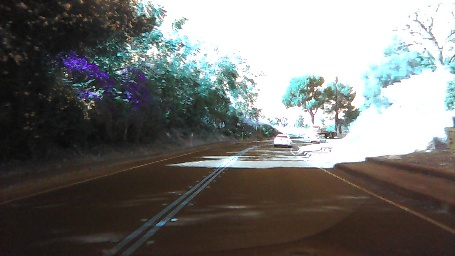

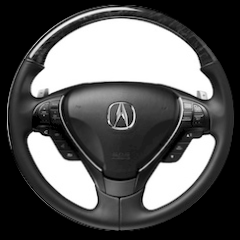

Steering angle: 6.372305667772967 (pred)	-10.08 (actual)


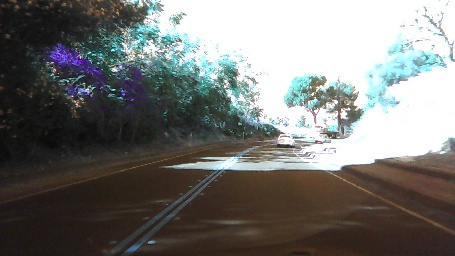

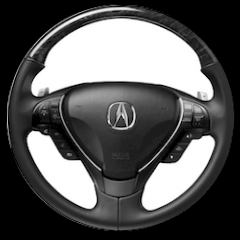

Steering angle: 5.031164727068759 (pred)	-9.380000000000003 (actual)


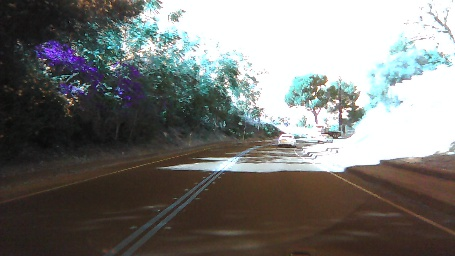

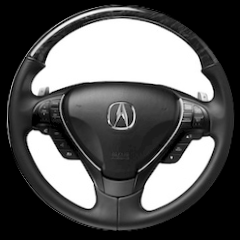

Steering angle: 7.777447615434309 (pred)	-7.559999999999999 (actual)


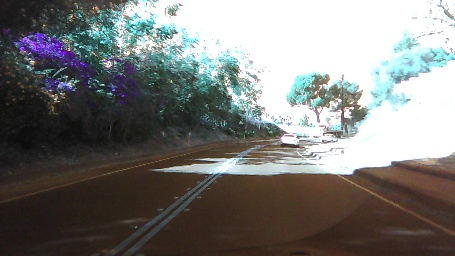

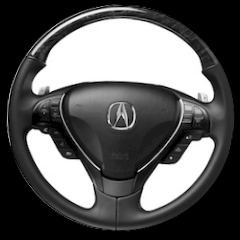

Steering angle: 8.58198755060116 (pred)	-5.949999999999999 (actual)


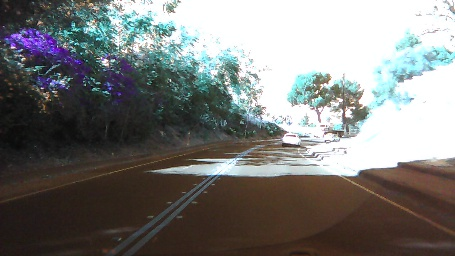

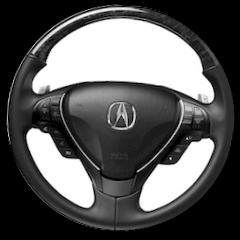

Steering angle: 7.482352707438493 (pred)	-3.23 (actual)


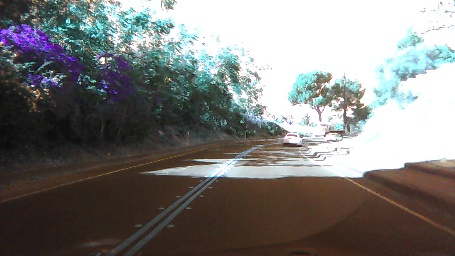

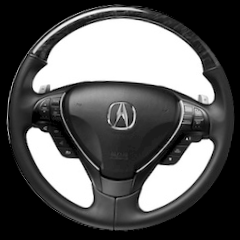

Steering angle: 5.967838940597737 (pred)	-0.81 (actual)


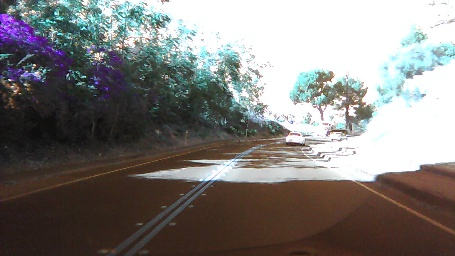

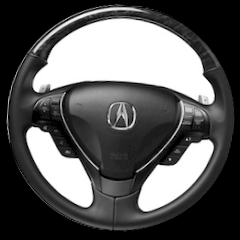

Steering angle: 2.0182709539804624 (pred)	1.21 (actual)


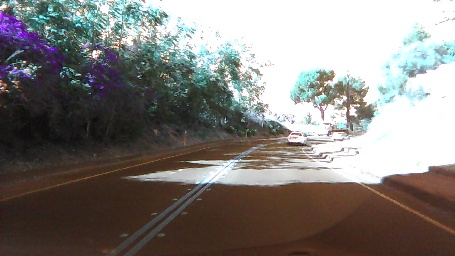

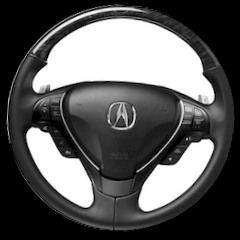

Steering angle: 1.9111863943993561 (pred)	3.4300000000000006 (actual)


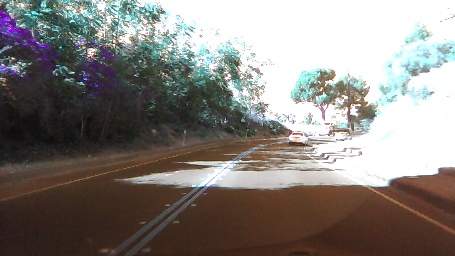

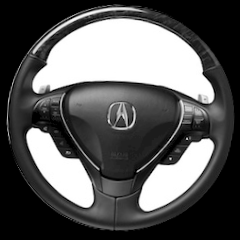

Steering angle: 2.5199088614867597 (pred)	4.44 (actual)


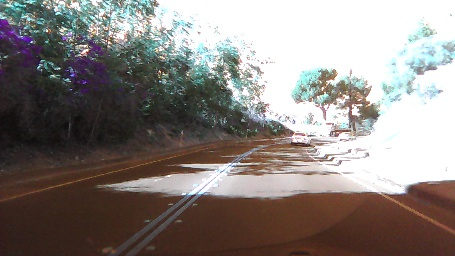

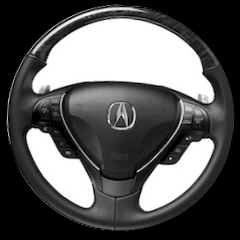

Steering angle: 2.5051276917926173 (pred)	5.340000000000001 (actual)


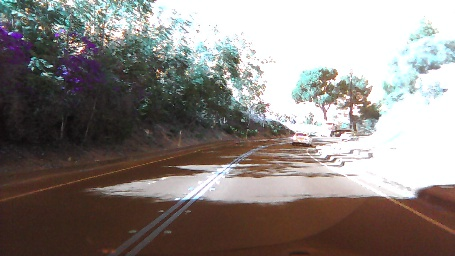

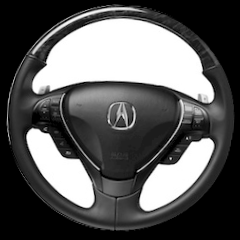

Steering angle: 2.929703989988246 (pred)	5.75 (actual)


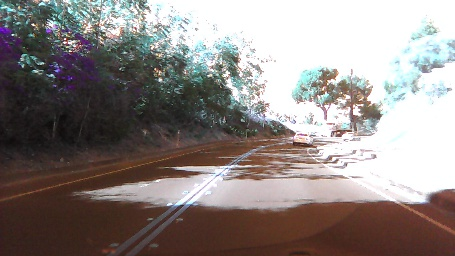

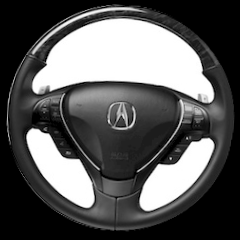

Steering angle: 0.21668152153907955 (pred)	7.16 (actual)


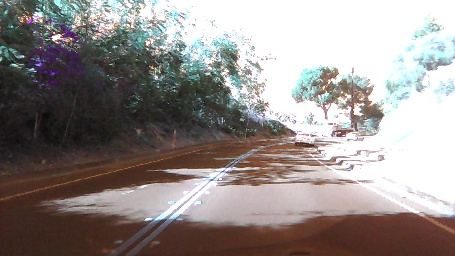

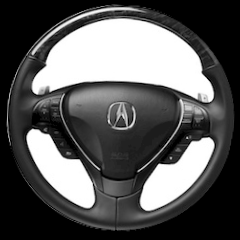

Steering angle: -1.777981804049946 (pred)	8.27 (actual)


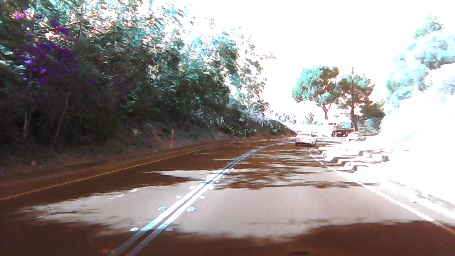

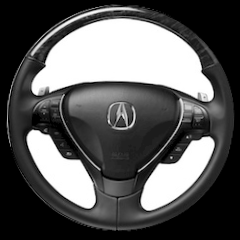

Steering angle: 1.2467770748437212 (pred)	9.48 (actual)


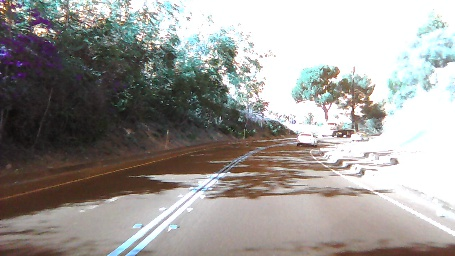

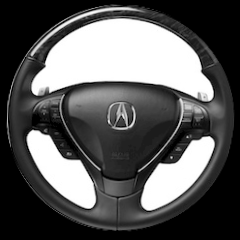

Steering angle: 5.569763562938346 (pred)	0.0 (actual)


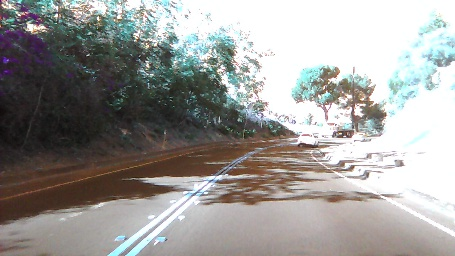

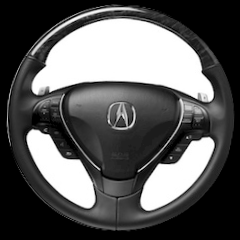

Steering angle: 0.6264629763220125 (pred)	9.88 (actual)


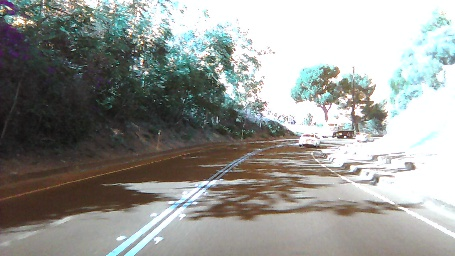

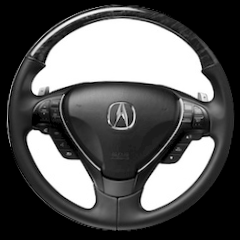

Steering angle: 1.0520458202857188 (pred)	9.979999999999999 (actual)


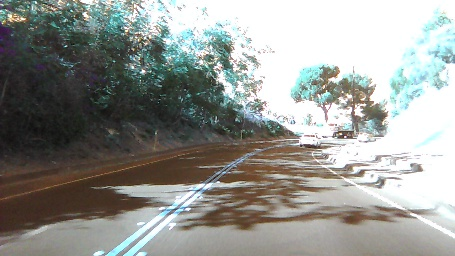

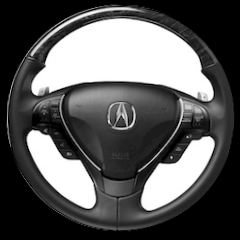

Steering angle: 6.5057193259440025 (pred)	10.389999999999999 (actual)


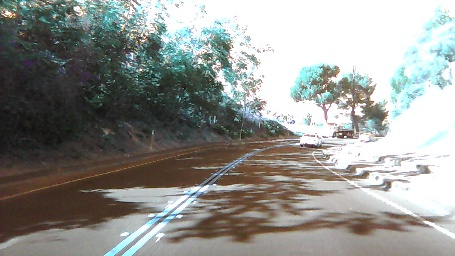

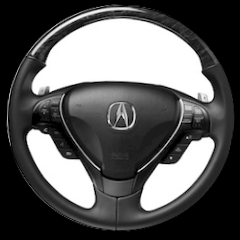

Steering angle: -0.12372882345392809 (pred)	11.6 (actual)


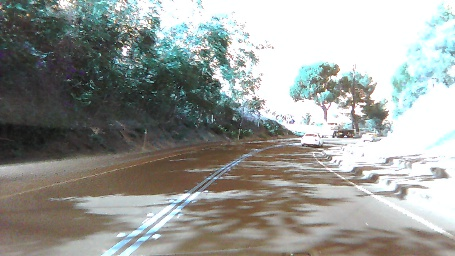

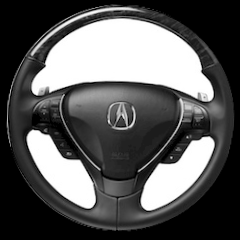

Steering angle: 2.432482226667185 (pred)	11.39 (actual)


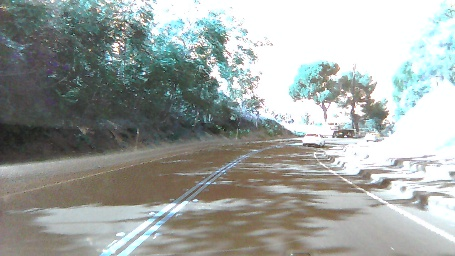

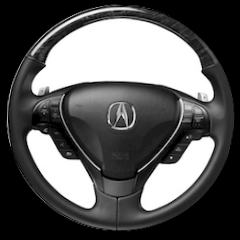

Steering angle: 2.517900785870776 (pred)	10.89 (actual)


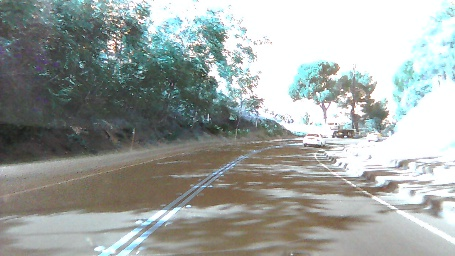

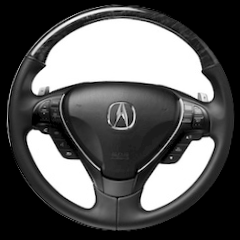

Steering angle: 3.239024474477906 (pred)	10.89 (actual)


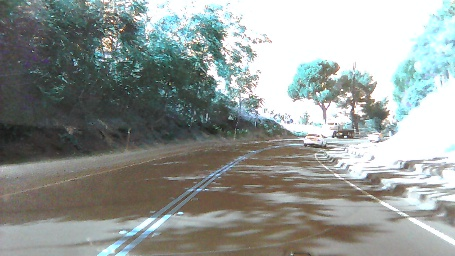

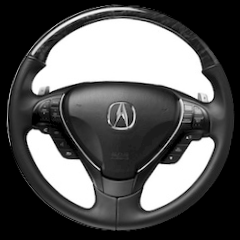

Steering angle: 2.331372588505959 (pred)	10.89 (actual)


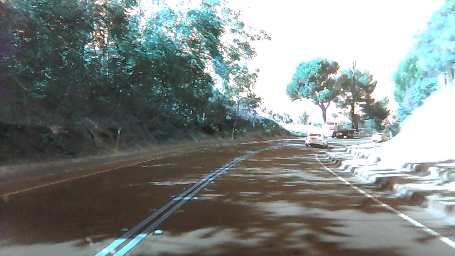

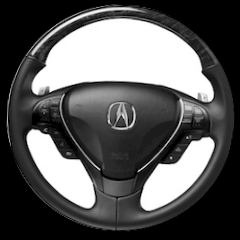

Steering angle: 3.6978277043781147 (pred)	10.59 (actual)


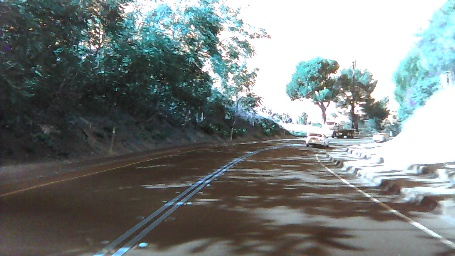

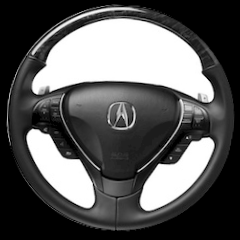

Steering angle: 1.5317929715021255 (pred)	10.389999999999999 (actual)


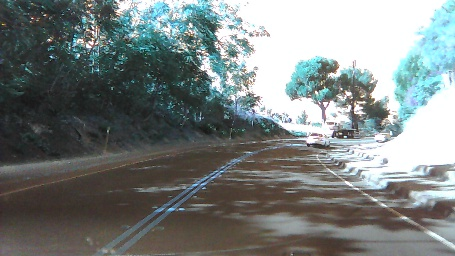

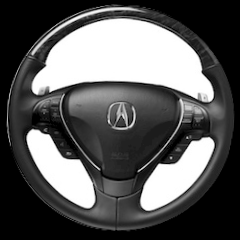

Steering angle: 2.6466203965347206 (pred)	10.389999999999999 (actual)


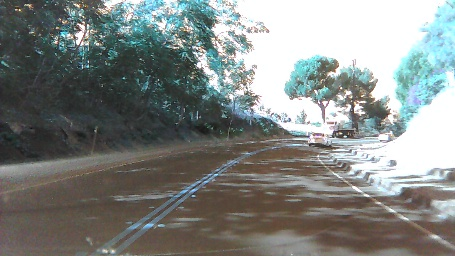

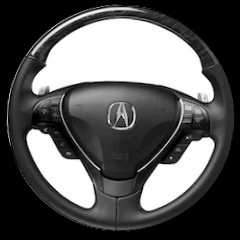

Steering angle: 1.3388926345285097 (pred)	10.79 (actual)


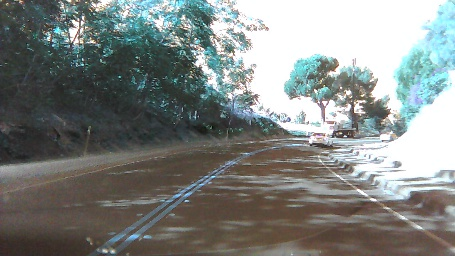

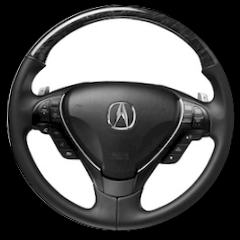

Steering angle: 1.4934720884420631 (pred)	11.6 (actual)


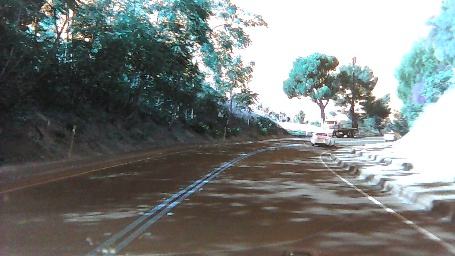

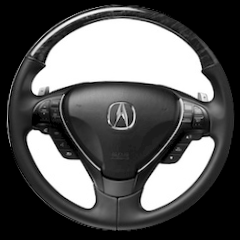

Steering angle: 1.6310918624813575 (pred)	12.0 (actual)


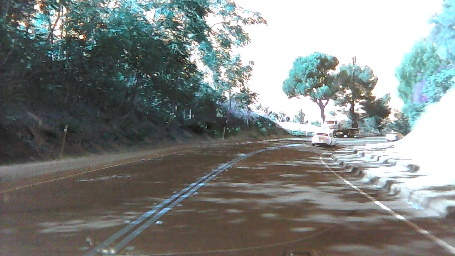

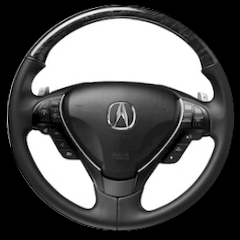

Steering angle: 2.564147569854109 (pred)	12.100000000000001 (actual)


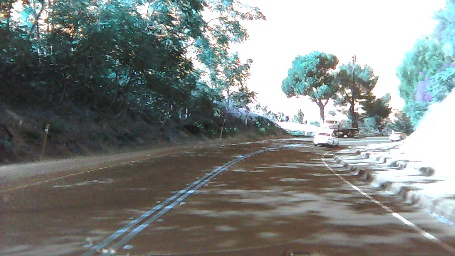

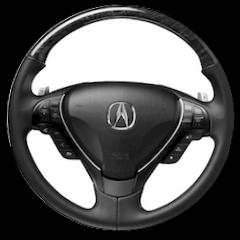

Steering angle: 4.613291619213264 (pred)	12.2 (actual)


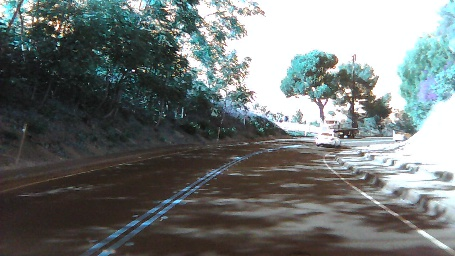

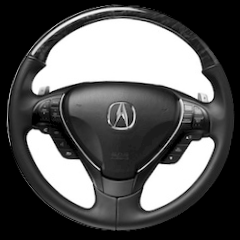

Steering angle: 5.450115297265825 (pred)	12.300000000000002 (actual)


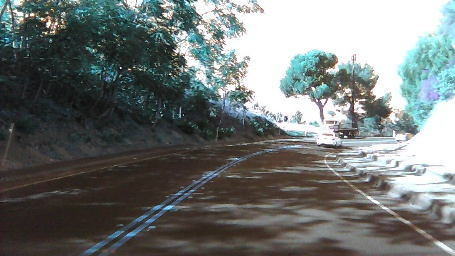

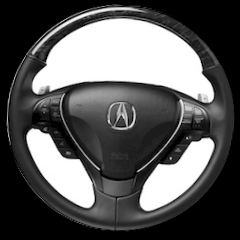

Steering angle: 4.933452040802557 (pred)	12.61 (actual)


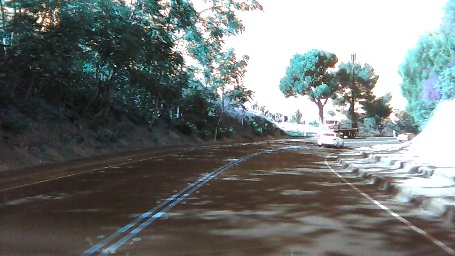

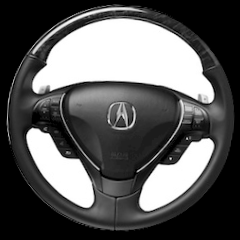

Steering angle: 4.891533462318896 (pred)	13.01 (actual)


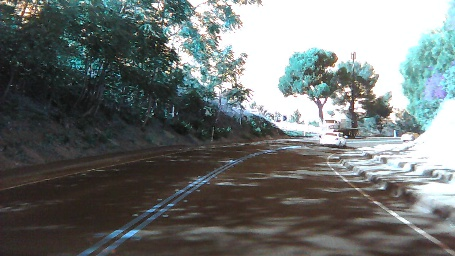

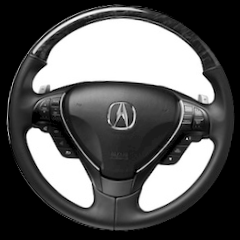

Steering angle: 4.894508009702437 (pred)	13.71 (actual)


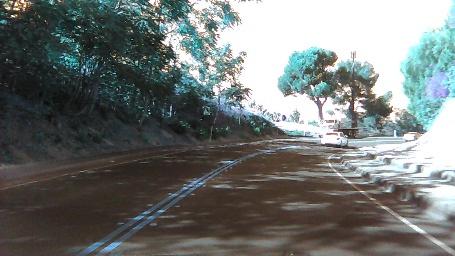

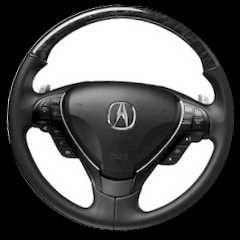

Steering angle: 4.730013148826434 (pred)	14.420000000000002 (actual)


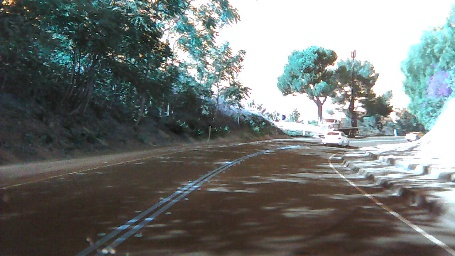

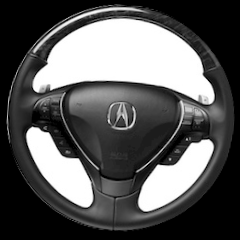

In [0]:
#pip3 install opencv-python

#import tensorflow as tf
import scipy.misc
import mod
import cv2
from subprocess import call
import math
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
from google.colab.patches import cv2_imshow

sess = tf.compat.v1.InteractiveSession()
saver = tf.train.Saver()
saver.restore(sess, "/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car/save/model.ckpt")

img = cv2.imread('/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car/steering_wheel_image.jpg',0)
rows,cols = img.shape

smoothed_angle = 0


#read data.txt
xs = []
ys = []
with open("/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car/driving_dataset/data.txt") as f:
    for line in f:
        xs.append("/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car/driving_dataset/" + line.split()[0])
        #the paper by Nvidia uses the inverse of the turning radius,
        #but steering wheel angle is proportional to the inverse of turning radius
        #so the steering wheel angle in radians is used as the output
        ys.append(float(line.split()[1]) * scipy.pi / 180)

#get number of images
num_images = len(xs)


i = math.ceil(num_images*0.8)
print("Starting frameofvideo:" +str(i))

while(cv2.waitKey(10) != ord('q')):
    full_image = cv2.imread("/content/drive/My Drive/Colab Notebooks/CS 11 : Self Driving Car/driving_dataset/" + str(i) + ".jpg", 1)
    image = cv2.resize(full_image[-150:], (200,66)) / 255.0
    degrees = mod.y.eval(feed_dict={mod.x: [image], mod.keep_prob: 1.0})[0][0] * 180.0 / scipy.pi
    #call("clear")
    #print("Predicted Steering angle: " + str(degrees))
    print("Steering angle: " + str(degrees) + " (pred)\t" + str(ys[i]*180/scipy.pi) + " (actual)")
    cv2_imshow( cv2.cvtColor(full_image, cv2.COLOR_RGB2BGR))
    #make smooth angle transitions by turning the steering wheel based on the difference of the current angle
    #and the predicted angle
    smoothed_angle += 0.2 * pow(abs((degrees - smoothed_angle)), 2.0 / 3.0) * (degrees - smoothed_angle) / abs(degrees - smoothed_angle)
    M = cv2.getRotationMatrix2D((cols/2,rows/2),-smoothed_angle,1)
    dst = cv2.warpAffine(img,M,(cols,rows))
    cv2_imshow( dst)
    i += 1

cv2.destroyAllWindows()


In [0]:

image = scipy.misc.imresize(full_image[-150:], [66, 200]) / 255.0